In [ ]:

from keras.utils import normalize
import os
import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt
import sys
import random

np.set_printoptions(threshold=sys.maxsize)

In [ ]:
!unzip /content/request_form_github.zip

Archive:  /content/request_form_github.zip
   creating: request_form_github/
   creating: request_form_github/X/
  inflating: request_form_github/X/06 OS - Copy.jpeg  
  inflating: request_form_github/X/22 OD - Copy.jpeg  
  inflating: request_form_github/X/26 OD - Copy.jpeg  
  inflating: request_form_github/X/31 OD - Copy.jpeg  
  inflating: request_form_github/X/33 OD - Copy.jpeg  
  inflating: request_form_github/X/34 OS - Copy.jpeg  
  inflating: request_form_github/X/50 OD - Copy.jpeg  
  inflating: request_form_github/X/64 OD - Copy.jpeg  
  inflating: request_form_github/X/108 OD - Copy.jpeg  
  inflating: request_form_github/X/56 OS - Copy.jpeg  
   creating: request_form_github/Y/
  inflating: request_form_github/Y/06 OS - Copy.jpeg  
  inflating: request_form_github/Y/108 OD - Copy.jpeg  
  inflating: request_form_github/Y/22 OD - Copy.jpeg  
  inflating: request_form_github/Y/26 OD - Copy.jpeg  
  inflating: request_form_github/Y/31 OD - Copy.jpeg  
  inflating: request_for

In [ ]:
#Resizing images
SIZE_X = 640
SIZE_Y = 640
n_classes= 9 # Number of classes for segmentation

TRAIN_PATH_X = '/content/request_form_github/X'
TRAIN_PATH_Y = '/content/request_form_github/Y'

train_ids_x = next(os.walk(TRAIN_PATH_X))[2]
train_ids_y = next(os.walk(TRAIN_PATH_Y))[2]

In [ ]:
#Capture training image info as a list
train_images = []

for directory_path in glob.glob(TRAIN_PATH_X):
    for img_path in glob.glob(os.path.join(directory_path, "*.jpeg")):
        img = cv2.imread(img_path, 0)
        img = cv2.resize(img, (SIZE_Y, SIZE_X))
        train_images.append(img)

#Convert list to array for machine learning processing
train_images = np.array(train_images)

In [ ]:
#Capture mask/label info as a list
train_masks = []
for directory_path in glob.glob(TRAIN_PATH_Y):
    for mask_path in glob.glob(os.path.join(directory_path, "*.jpeg")):
        mask = cv2.imread(mask_path, 0)
        mask = cv2.resize(mask, (SIZE_Y, SIZE_X), interpolation = cv2.INTER_NEAREST)  #Otherwise ground truth changes due to interpolation
        train_masks.append(mask)

#Convert list to array for machine learning processing
train_masks = np.array(train_masks)

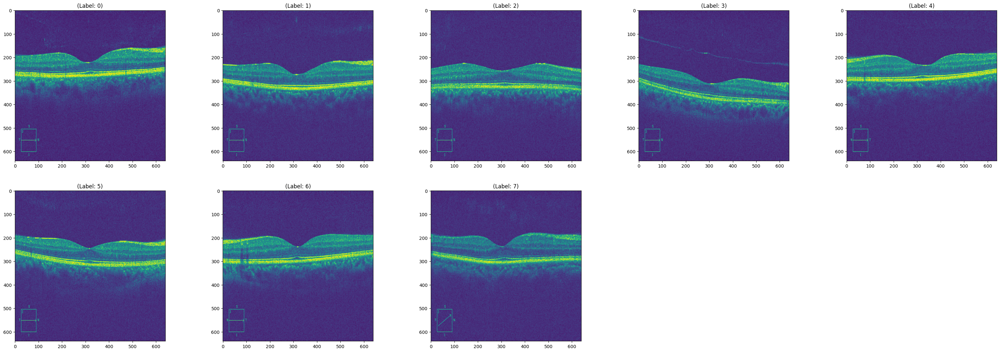

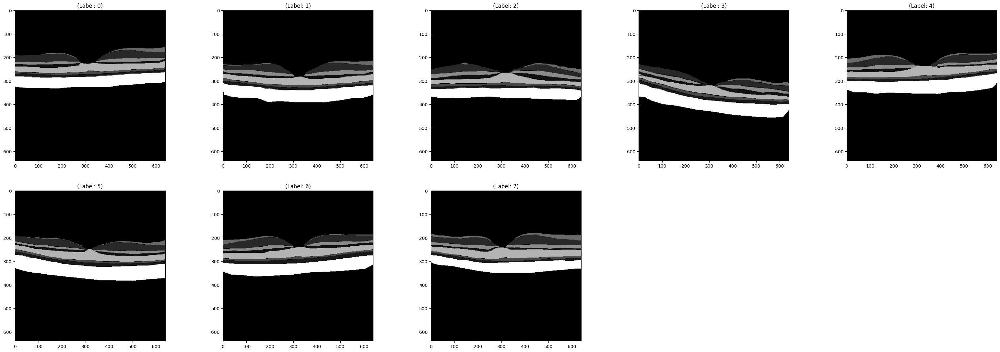

In [ ]:
plt.figure(figsize=(40,100))
for i in range(8):
    plt.subplot(14, 5, i+1)
    plt.imshow(train_images[i,:,:])
    plt.title("(Label: " + str(i) + ")")
plt.show()

plt.figure(figsize=(40,100))
for i in range(8):
    plt.subplot(14, 5, i+1)
    plt.imshow(train_masks[i,:,:],cmap='gray')
    plt.title("(Label: " + str(i) + ")")
plt.show()

In [ ]:
#Encode labels
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
n, h, w = train_masks.shape
train_masks_reshaped = train_masks.reshape(-1,1)
train_masks_reshaped_encoded = labelencoder.fit_transform(train_masks_reshaped)
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(n, h, w)

np.unique(train_masks_encoded_original_shape)

train_images = np.expand_dims(train_images, axis=3)
train_images = normalize(train_images, axis=1)

train_masks_input = np.expand_dims(train_masks_encoded_original_shape, axis=3)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:

#Create a subset of data for quick testing
#Picking 10% for testing and remaining for training
from sklearn.model_selection import train_test_split
X1, X_test, y1, y_test = train_test_split(train_images, train_masks_input, test_size = 0.10, random_state = 0)

#Further split training data t a smaller subset for quick testing of models
X_train, X_do_not_use, y_train, y_do_not_use = train_test_split(X1, y1, test_size = 0.2, random_state = 0)

print("Class values in the dataset are ... ", np.unique(y_train))  # 0 is the background/few unlabeled


Class values in the dataset are ...  [0 1 2 3 4 5 6 7 8]


In [ ]:
from keras.utils import to_categorical
train_masks_cat = to_categorical(y_train, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2], n_classes))



test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))


IMG_HEIGHT = X_train.shape[1]
IMG_WIDTH  = X_train.shape[2]
IMG_CHANNELS = X_train.shape[3]

In [ ]:
from keras.layers import Layer, Conv2D
import tensorflow as tf

class DenseAttentionLayer(Layer):
    def __init__(self, channels, **kwargs):
        super(DenseAttentionLayer, self).__init__(**kwargs)
        self.channels = channels
        # Define attention components
        self.dense_1 = Conv2D(self.channels // 8, (1, 1), activation='relu')
        self.dense_2 = Conv2D(self.channels, (1, 1), activation='sigmoid')

    def call(self, inputs):
        # Global average pooling
        avg_pool = tf.reduce_mean(inputs, axis=[1, 2], keepdims=True)
        dense_1_output = self.dense_1(avg_pool)
        dense_2_output = self.dense_2(dense_1_output)
        return inputs * dense_2_output

    def build(self, input_shape):
        self.channels = input_shape[-1]

class SparseAttentionLayer(Layer):
    def __init__(self, channels, **kwargs):
        super(SparseAttentionLayer, self).__init__(**kwargs)
        self.channels = channels
        # Define attention components
        self.conv1 = Conv2D(self.channels // 8, (3, 3), padding='same', activation='relu')
        self.conv2 = Conv2D(self.channels, (3, 3), padding='same', activation='sigmoid')

    def call(self, inputs):
        attention_map = self.conv1(inputs)
        attention_map = self.conv2(attention_map)
        return inputs * attention_map

    def build(self, input_shape):
        self.channels = input_shape[-1]


In [ ]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, Dropout

def dense_sparse_multi_unet_model_new(n_classes=4, IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=1):

    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    s = inputs

    # Contraction path with multi-level sparse attention
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)

    c1 = SparseAttentionLayer(16)(c1)

    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)

    c2 = SparseAttentionLayer(32)(c2)

    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)

    c3 = SparseAttentionLayer(64)(c3)
    c3 = DenseAttentionLayer(64)(c3)

    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)

    c4 = DenseAttentionLayer(128)(c4)

    p4 = MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    c5 = DenseAttentionLayer(256)(c5)  # Apply dense attention here

    # Expansive path with multi-level sparse attention
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    c6 = SparseAttentionLayer(128)(c6)  # Apply sparse attention here

    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    c7 = SparseAttentionLayer(64)(c7)  # Apply sparse attention here

    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    c8 = SparseAttentionLayer(32)(c8)  # Apply sparse attention here

    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])

    return model


In [ ]:

n_classes = 9
SIZE_X =640
SIZE_Y = 640


def get_model():
    return dense_sparse_multi_unet_model_new(n_classes=n_classes, IMG_HEIGHT=SIZE_Y, IMG_WIDTH=SIZE_X, IMG_CHANNELS=1)


model = get_model()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

# Fit the model
history = model.fit(X_train, y_train_cat,
                    batch_size=16,
                    verbose=1,
                    epochs=300,
                    validation_data=(X_test, y_test_cat),
                    # class_weight=class_weights,  # If you have imbalanced data, use class weights
                    shuffle=False)

# Evaluate the model
_, acc = model.evaluate(X_test, y_test_cat, verbose=0)
print(f"Accuracy is = {acc * 100:.2f}%")


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 640, 640, 1)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 640, 640, 16)   │            160 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 640, 640, 16)   │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 640, 640, 16)   │          2,320 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sparse_attention_layer    │ (None, 640, 640, 16)   │            594 │ conv2d_1[0][0]         │
│ (SparseAttentionLayer)    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 320, 320, 16)   │              0 │ sparse_attention_laye… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 320, 320, 32)   │          4,640 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 320, 320, 32)   │              0 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 320, 320, 32)   │          9,248 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sparse_attention_layer_1  │ (None, 320, 320, 32)   │          2,340 │ conv2d_5[0][0]         │
│ (SparseAttentionLayer)    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 160, 160, 32)   │              0 │ sparse_attention_laye… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 160, 160, 64)   │         18,496 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 160, 160, 64)   │              0 │ conv2d_8[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, 160, 160, 64)   │         36,928 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sparse_attention_layer_2  │ (None, 160, 160, 64)   │          9,288 │ conv2d_9[0][0]         │
│ (SparseAttentionLayer)    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_attention_layer     │ (None, 160, 160, 64)   │          1,096 │ sparse_attention_laye… │
│ (DenseAttentionLayer)     │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2      

 Total params: 2,023,819 (7.72 MB)

 Trainable params: 2,023,819 (7.72 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/300


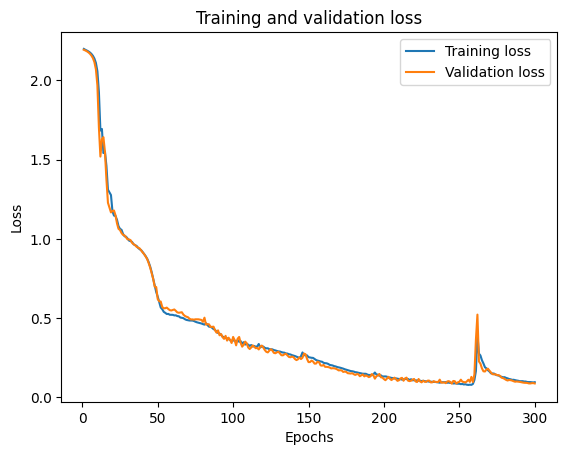

In [ ]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

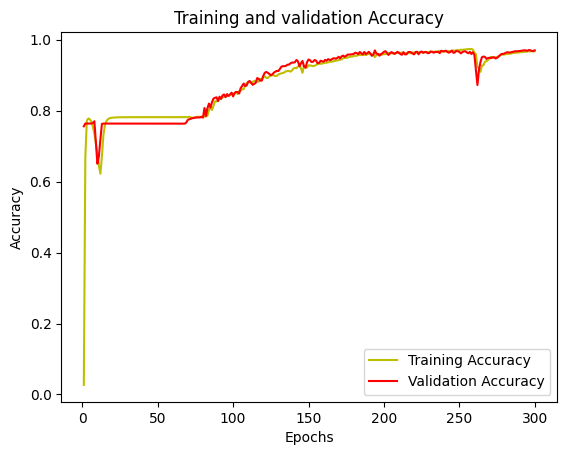

In [ ]:

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

plt.plot(epochs, acc, 'y', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [ ]:
y_pred=model.predict(X_test)
y_pred_argmax=np.argmax(y_pred, axis=3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


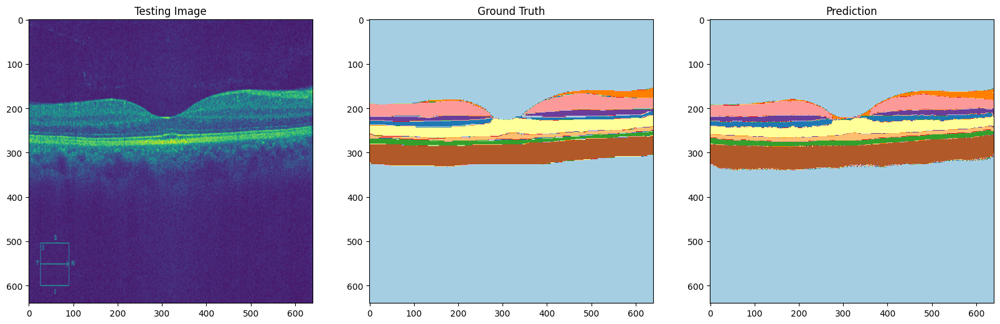

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


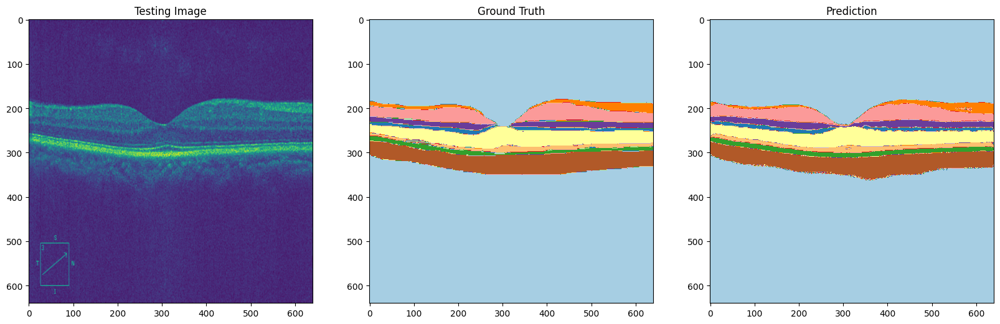

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


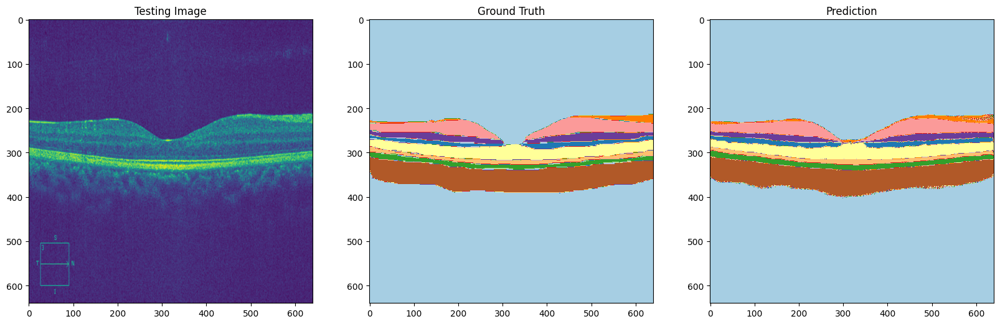

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


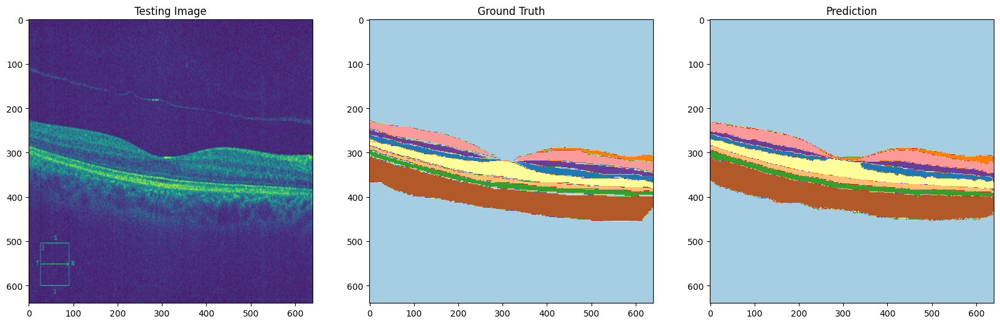

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


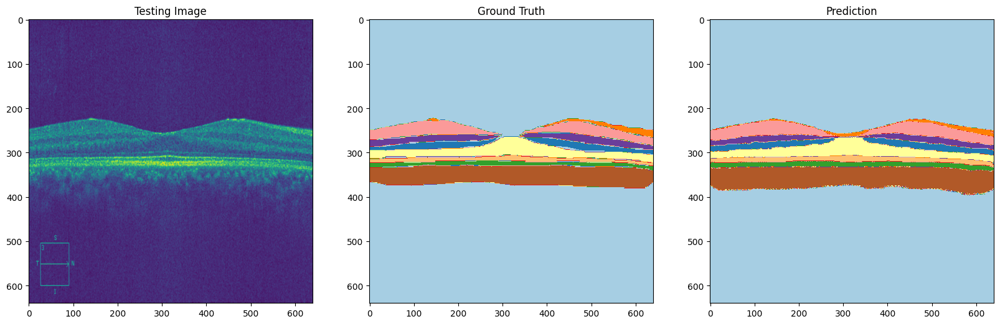

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


for i in range(5):
    test_img_number = i
    test_img = X_test[test_img_number]
    ground_truth = y_test[test_img_number]
    test_img_norm = test_img[:, :, 0][:, :, None]
    test_img_input = np.expand_dims(test_img_norm, 0)


    prediction = model.predict(test_img_input)
    predicted_img = np.argmax(prediction, axis=3)[0, :, :]


    plt.figure(figsize=(20, 10))

    plt.subplot(1, 3, 1)
    plt.title('Testing Image')
    plt.imshow(test_img[:, :, 0])

    plt.subplot(1, 3, 2)
    plt.title('Ground Truth')
    plt.imshow(ground_truth[:, :, 0], cmap='Paired')

    plt.subplot(1, 3, 3)
    plt.title('Prediction')
    plt.imshow(predicted_img, cmap='Paired')

    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


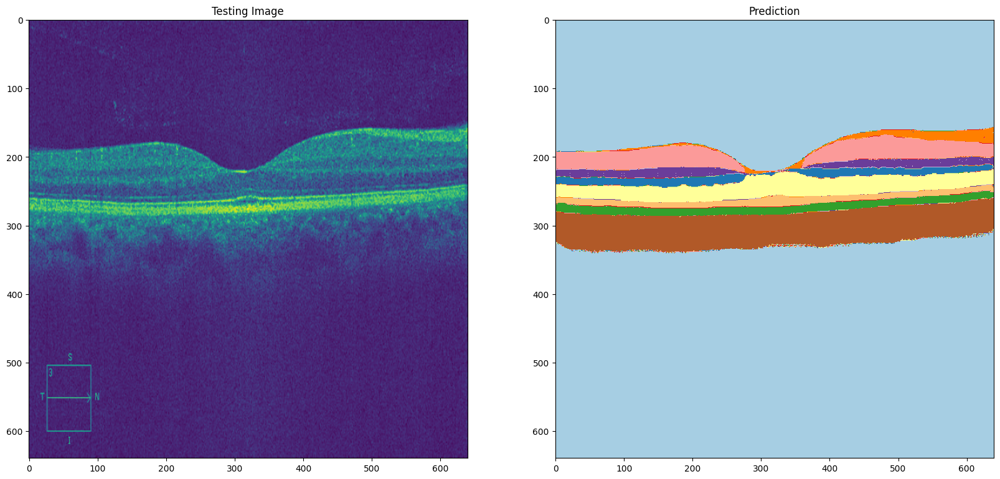

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


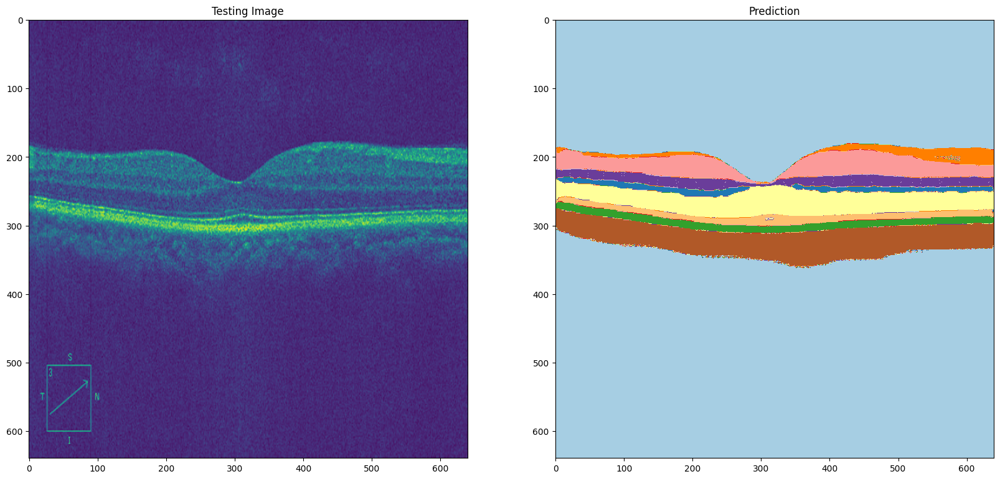

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


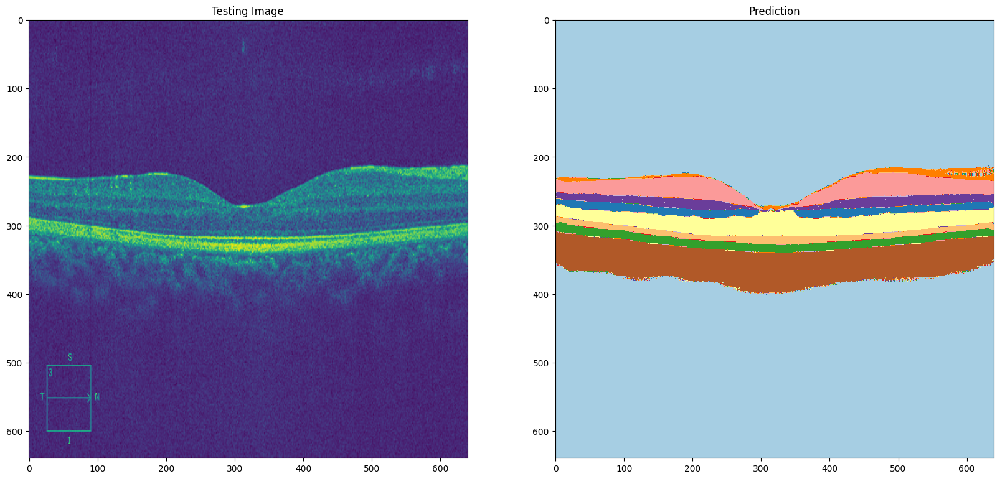

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


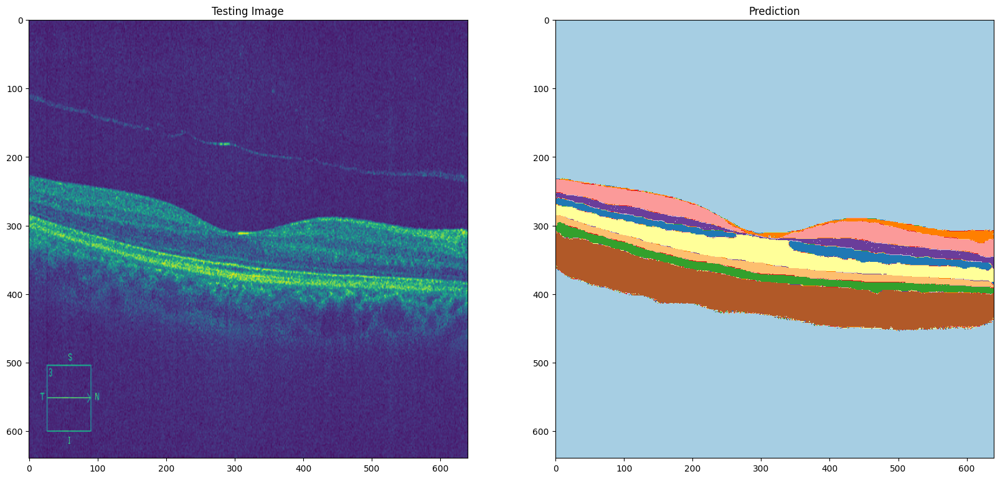

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


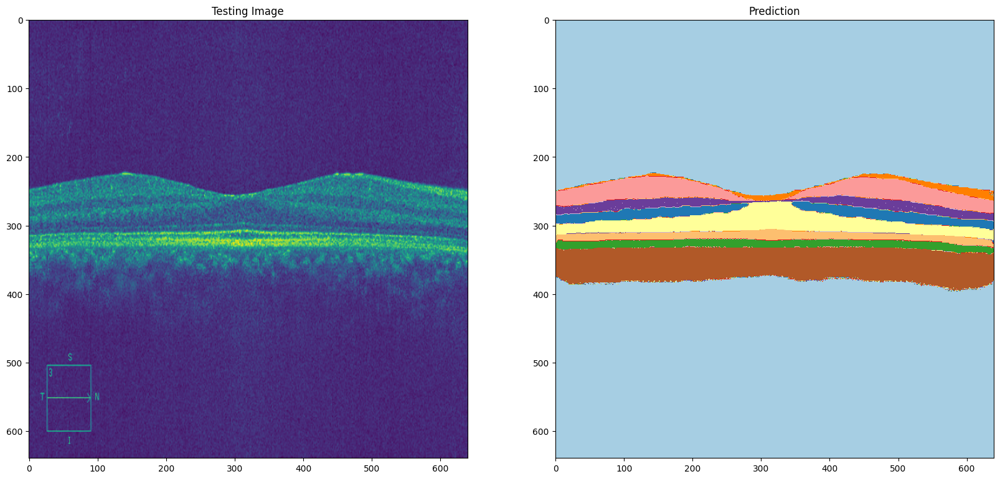

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


for i in range(5):
    test_img_number = i
    test_img = X_test[test_img_number]
    ground_truth = y_test[test_img_number]
    test_img_norm = test_img[:, :, 0][:, :, None]
    test_img_input = np.expand_dims(test_img_norm, 0)

    # Get prediction
    prediction = model.predict(test_img_input)
    predicted_img = np.argmax(prediction, axis=3)[0, :, :]


    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    plt.title('Testing Image')
    plt.imshow(test_img[:, :, 0])


    plt.subplot(1, 2, 2)
    plt.title('Prediction')
    plt.imshow(predicted_img, cmap='Paired')

    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


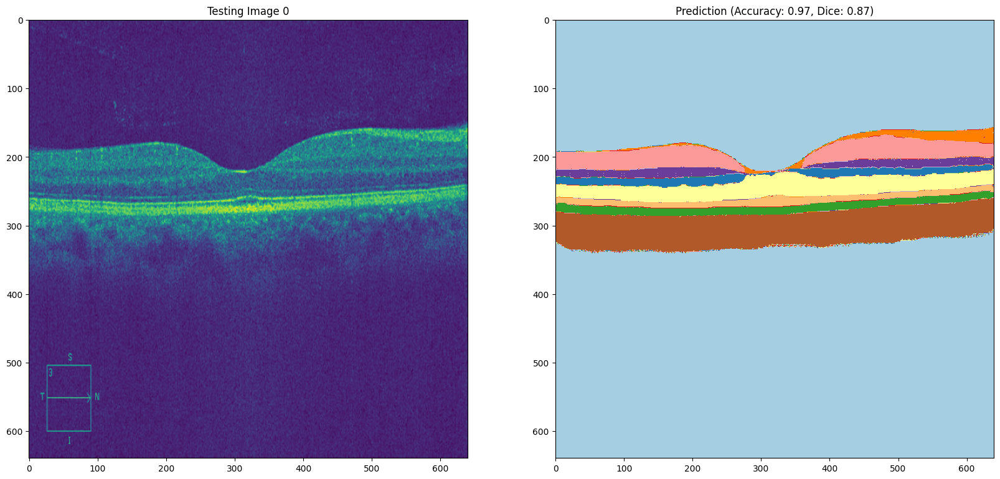

Image 0: Accuracy = 0.97, Mean Sensitivity = 0.92, Mean Specificity = 1.00, Mean Dice Score = 0.87
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


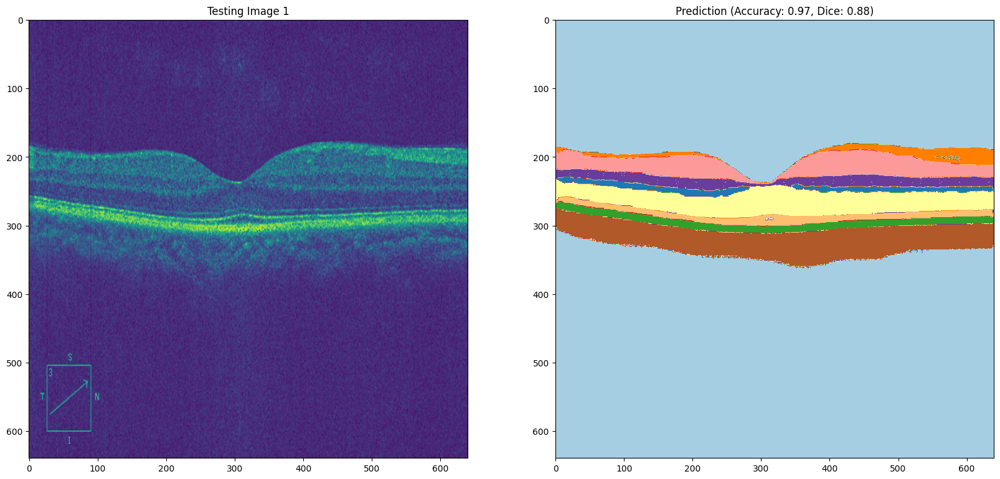

Image 1: Accuracy = 0.97, Mean Sensitivity = 0.91, Mean Specificity = 1.00, Mean Dice Score = 0.88
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


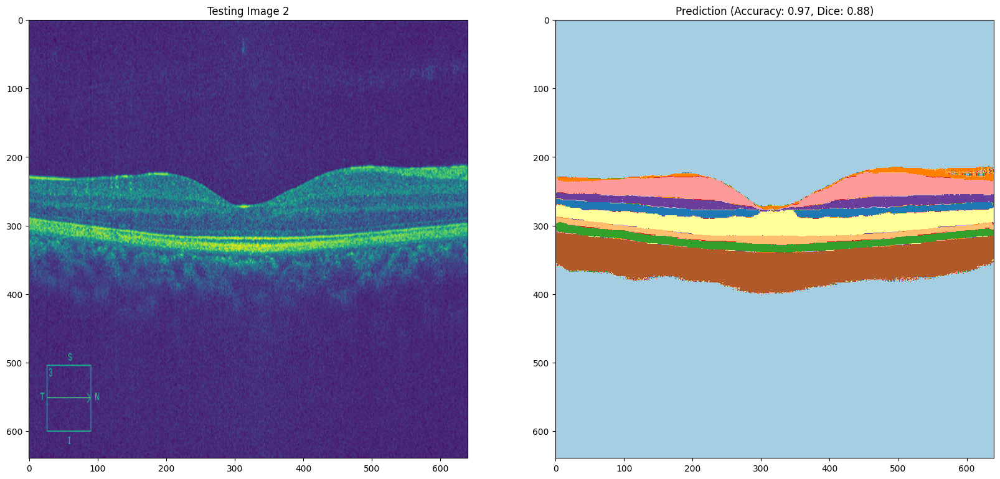

Image 2: Accuracy = 0.97, Mean Sensitivity = 0.91, Mean Specificity = 0.99, Mean Dice Score = 0.88
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


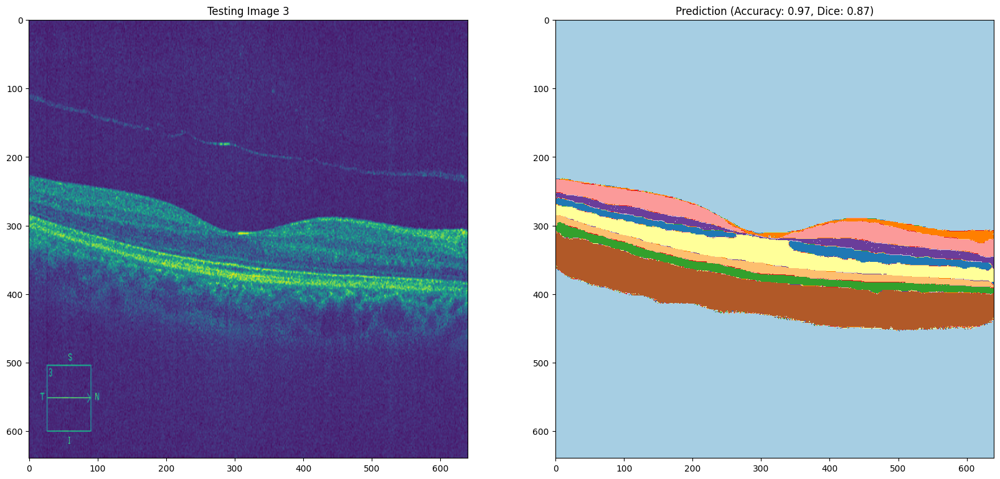

Image 3: Accuracy = 0.97, Mean Sensitivity = 0.91, Mean Specificity = 1.00, Mean Dice Score = 0.87
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


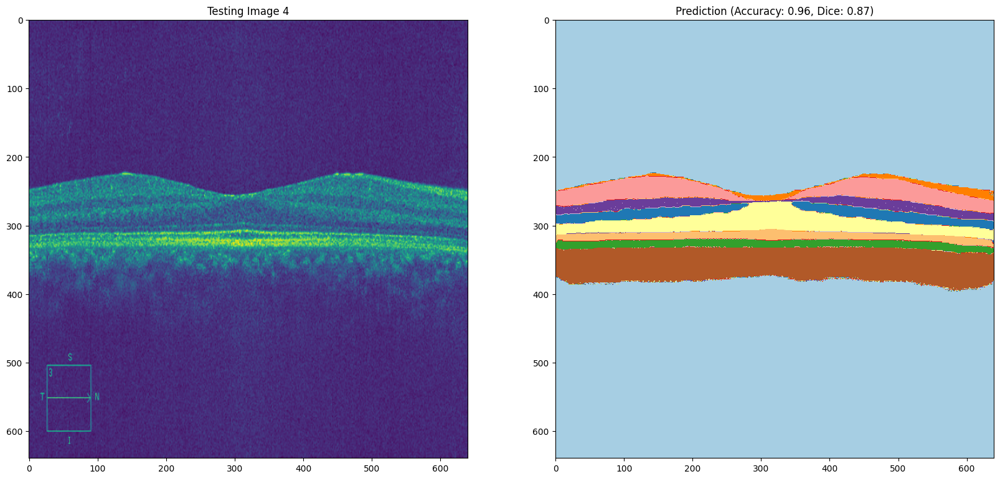

Image 4: Accuracy = 0.96, Mean Sensitivity = 0.92, Mean Specificity = 1.00, Mean Dice Score = 0.87


In [ ]:
from sklearn.metrics import confusion_matrix


def compute_multiclass_metrics(ground_truth, predicted_img, num_classes):

    ground_truth_flat = ground_truth.flatten()
    predicted_img_flat = predicted_img.flatten()

    # Initialize accumulators
    accuracy = np.mean(ground_truth_flat == predicted_img_flat)

    sensitivity_per_class = []
    specificity_per_class = []
    dice_per_class = []

    for i in range(num_classes):

        true_class = (ground_truth_flat == i).astype(int)
        predicted_class = (predicted_img_flat == i).astype(int)

        tp = np.sum((true_class == 1) & (predicted_class == 1))
        tn = np.sum((true_class == 0) & (predicted_class == 0))
        fp = np.sum((true_class == 0) & (predicted_class == 1))
        fn = np.sum((true_class == 1) & (predicted_class == 0))


        sensitivity = tp / (tp + fn) if (tp + fn) != 0 else 0
        sensitivity_per_class.append(sensitivity)


        specificity = tn / (tn + fp) if (tn + fp) != 0 else 0
        specificity_per_class.append(specificity)

        dice_score = (2 * tp) / (2 * tp + fp + fn) if (2 * tp + fp + fn) != 0 else 0
        dice_per_class.append(dice_score)

    # Average across all classes
    mean_sensitivity = np.mean(sensitivity_per_class)
    mean_specificity = np.mean(specificity_per_class)
    mean_dice = np.mean(dice_per_class)

    return accuracy, mean_sensitivity, mean_specificity, mean_dice

num_classes = 9


for i in range(5):
    test_img_number = i
    test_img = X_train[test_img_number]
    ground_truth = y_train[test_img_number][:, :, 0]
    test_img_norm = test_img[:, :, 0][:, :, None]
    test_img_input = np.expand_dims(test_img_norm, 0)

    # Get prediction
    prediction = model.predict(test_img_input)
    predicted_img = np.argmax(prediction, axis=3)[0, :, :]


    accuracy, mean_sensitivity, mean_specificity, mean_dice = compute_multiclass_metrics(ground_truth, predicted_img, num_classes)

    # Plotting images
    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    plt.title(f'Testing Image {i}')
    plt.imshow(test_img[:, :, 0])

    plt.subplot(1, 2, 2)
    plt.title(f'Prediction (Accuracy: {accuracy:.2f}, Dice: {mean_dice:.2f})')
    plt.imshow(predicted_img, cmap='Paired')

    plt.show()

    # Print the metrics
    print(f"Image {i}: Accuracy = {accuracy:.2f}, Mean Sensitivity = {mean_sensitivity:.2f}, Mean Specificity = {mean_specificity:.2f}, Mean Dice Score = {mean_dice:.2f}")
